#### Manual annotation of Xenium add-on panel healthy gut data 
- **Developed by:** Anna Maguza
- **Affilation:** Faculty of Medicine, Würzburg University
- **Created date:** 2nd August 2024
- **Last modified date:** 18th October 2024

##### Import packages

In [19]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import plotnine as p

##### Setup working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.3
scanpy      1.9.6
-----
PIL                         10.1.0
absl                        NA
aiohttp                     3.8.6
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.13.1
backoff                     2.2.1
brotli                      1.1.0
bs4                         4.12.2
certifi                     2024.02.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.7
click                       8.1.7
colorama                    0.4.6
comm                        0.1.4
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.8.0
decor

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

In [5]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

### Read in data

In [6]:
adata = sc.read_h5ad('data/10X_Xenium_adult_colon_data/Annotation_prediction/Xenium_cell_states_161024.h5ad')
X_is_raw(adata)

True

In [7]:
adataSC = sc.read_h5ad('data/10X_Xenium_adult_colon_data/Annotation_prediction/Xenium_SC_states_181024.h5ad')
X_is_raw(adataSC)

True

+ Add Stem cells subsets to the object

In [8]:
adataSC.obs['SC_subsets'] = adataSC.obs['C_scANVI'].copy()

In [9]:
adata.obs = adata.obs.merge(adataSC.obs[['SC_subsets']], left_index=True, right_index=True, how='left')

In [10]:
adata.obs['Cell_State'] = adata.obs['C_scANVI'].copy()

In [11]:
adata.obs['Cell_State'] = adata.obs['Cell_State'].cat.add_categories(['MTRNR2L12+ASS1+_SC',
                                                                      'RPS10+_RPS17+_SC',
                                                                      'FXYD3+_CKB+_SC'])

adata.obs.loc[adata.obs['SC_subsets'] == 'MTRNR2L12+ASS1+_SC', 'Cell_State'] = 'MTRNR2L12+ASS1+_SC'
adata.obs.loc[adata.obs['SC_subsets'] == 'RPS10+_RPS17+_SC', 'Cell_State'] = 'RPS10+_RPS17+_SC'
adata.obs.loc[adata.obs['SC_subsets'] == 'FXYD3+_CKB+_SC', 'Cell_State'] = 'FXYD3+_CKB+_SC'

#### Run scVI

In [12]:
adata.layers['counts'] = adata.X.copy()

In [13]:
scvi.model.SCVI.setup_anndata(adata,
                              layer = 'counts',
                              labels_key = 'Cell_State')

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [15]:
scvi_model = scvi.model.SCVI(adata,
                            n_latent = 50, 
                            n_layers = 3, 
                            dispersion = 'gene-batch', 
                            gene_likelihood = 'nb')

In [16]:
scvi_model.train(100, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = "gpu",
                 devices = [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 100/100: 100%|█| 100/100 [17:36<00:00, 10.42s/it, v_num=1, train_loss_step=105, tra

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█| 100/100 [17:36<00:00, 10.57s/it, v_num=1, train_loss_step=105, tra


In [17]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

#### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

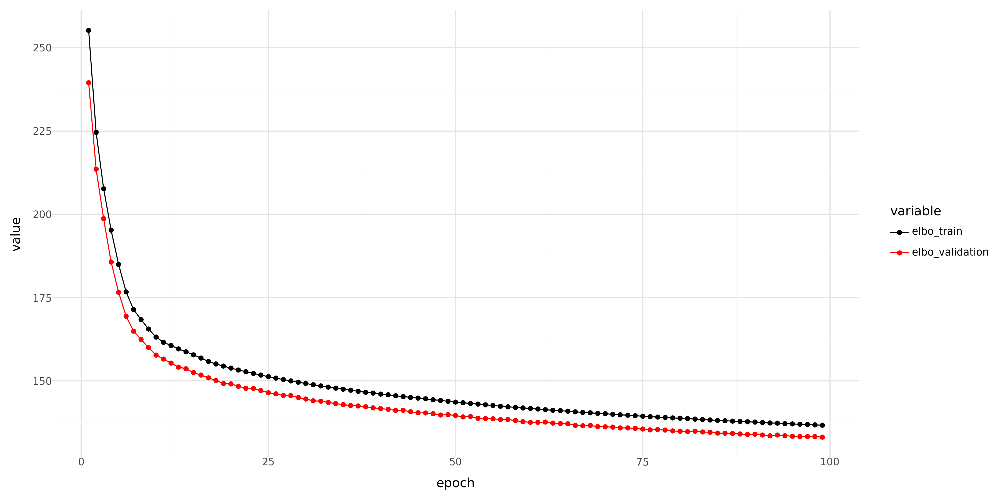

In [20]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

print(p_)

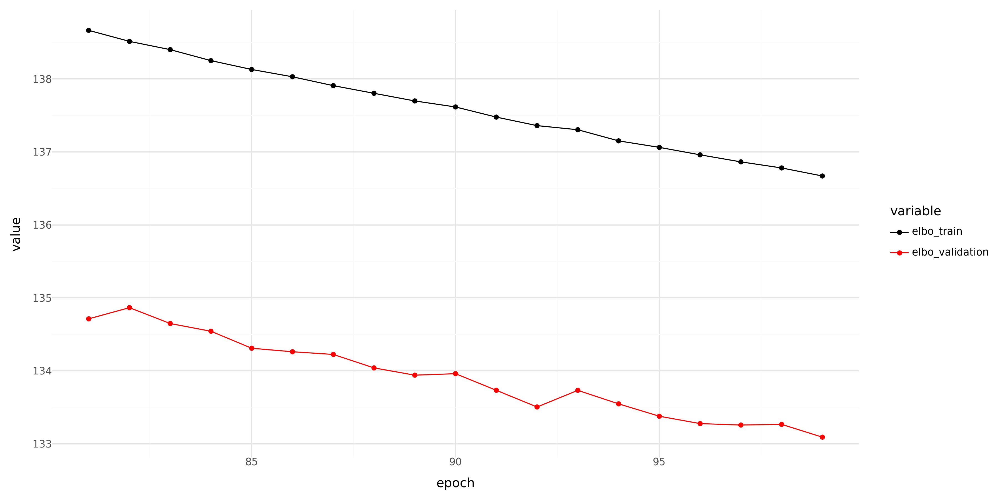

In [21]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 80'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

print(p_)

+ Visualize dataset

In [22]:
sc.pp.neighbors(adata, use_rep = "X_scVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:47)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:30)


In [33]:
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 275822 × 414
    obs: 'Study_name', 'Donor_ID', 'Library_Preparation_Protocol', 'dataset', '_scvi_batch', '_scvi_labels', 'seed_labels', 'C_scANVI', 'SC_subsets', 'Cell_State'
    var: 'gene_ids-query', 'feature_types-query', 'genome-query', 'feature_types-0-0-0-reference', 'gene_name-1-0-0-reference', 'gene_id-0-0-reference', 'GENE-1-0-reference'
    uns: 'C_scANVI_colors', 'Donor_ID_colors', 'Library_Preparation_Protocol_colors', 'Study_name_colors', '_scvi_manager_uuid', '_scvi_uuid', 'neighbors', 'seed_labels_colors', 'umap', 'Cell_State_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'>

In [31]:
adata_copy = adata.copy()

In [32]:
adata.obs.dropna(axis=1, how='all', inplace=True)

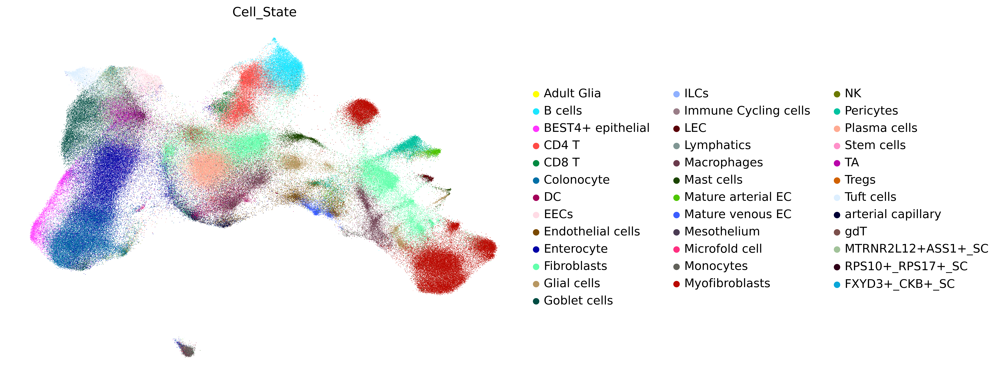

In [25]:
sc.set_figure_params(dpi = 300, figsize=(10,7))
sc.pl.umap(adata, color = ['Cell_State'], ncols = 2, frameon = False, size = 1)

In [34]:
adata.write_h5ad('data/10X_Xenium_adult_colon_data/Annotation_prediction/Xenium_annotated_181024.h5ad')